### Objective
A friend had personally collected bike ride related measurements from his 4 separate bike rides within the San Francisco bay area. 
The goal is to estimate `power` (watts) from the remaining measurements. 
Data was generally collected at 1 second intervals. The plan is to train on 3 data sets including this one, and test on the remaining dataset.
This EDA uses data from a single bike ride.

Various sensors were used:
- Garmin Edge 1040 Bike Computer with GPS (lat/lon, speed, altitude)
- Garmin HRM-Pro chest strap heart-rate monitor
- Garmin Varia RTL515 bike radar (vehicle count; not shown in this EDA)
- SRAM Quarq Rival AXS power meter (power, cadence)

The bottom 3 sensors transmit measurements in real-time to the Bike Computer. 
After each ride, the collected data was uploaded to Garmin's web site. I've downloaded the data from that web site in Garmin's proprietary '.fit' binary format. 
Utilizing a 3rd party decoder, a script was written to extract relevant information to CSV format, which this EDA is based on. 
The script is available in the ../src/utils directory for reference.

**NOTE**: plotly plots do not seem to appear in notebooks within github. Please download and execute in order to see them.

### Import Data

In [1]:
import sys
import os
import time
import glob
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

sys.path.append(os.path.abspath('..'))
import src.utils.garmin_utils as garmin_utils
from src.utils.matfcns import movmean

In [2]:
input_file = '../data/garmin/raw/garmin-connect-3452356474__1693067992.csv'
processed_file = '../data/garmin/processed/eda__1693067992.csv' # the result of cleaning raw data
output_dir = '../data/garmin/figs'

In [3]:
df0 = pd.read_csv(input_file)
df0 = df0.replace('None', np.nan) # heart_rate has this

df0['heart_rate'] = pd.to_numeric(df0['heart_rate'])
df0['timestamp'] = pd.to_datetime(df0['timestamp'])
df0.set_index(df0['timestamp'], inplace=True)
df0 = df0.drop_duplicates(subset=['timestamp'], ignore_index=True)

df0.info()
df0.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19987 entries, 0 to 19986
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   timestamp           19987 non-null  datetime64[ns]
 1   position_lat        19928 non-null  float64       
 2   position_long       19928 non-null  float64       
 3   distance            19987 non-null  float64       
 4   enhanced_speed      19928 non-null  float64       
 5   enhanced_altitude   19987 non-null  float64       
 6   power               19918 non-null  float64       
 7   heart_rate          19987 non-null  int64         
 8   cadence             19683 non-null  float64       
 9   temperature         19987 non-null  int64         
 10  fractional_cadence  19683 non-null  float64       
dtypes: datetime64[ns](1), float64(8), int64(2)
memory usage: 1.7 MB


,timestamp,position_lat,position_long,distance,enhanced_speed,enhanced_altitude,power,heart_rate,cadence,temperature,fractional_cadence
0,2023-08-26 09:39:52,37.436450,-122.127611,0.00,2.650,4.4,0.0,97,0.0,25,0.0
1,2023-08-26 09:39:53,37.436460,-122.127639,2.64,2.557,4.2,0.0,97,0.0,25,0.0
2,2023-08-26 09:39:54,37.436470,-122.127668,5.41,2.370,4.2,0.0,97,0.0,25,0.0
3,2023-08-26 09:39:55,37.436482,-122.127693,8.00,2.351,4.2,0.0,97,0.0,25,0.0
4,2023-08-26 09:39:56,37.436492,-122.127716,10.39,2.361,4.2,0.0,96,0.0,25,0.0


#### Features dictionary
- (`position_lat`, `position_long`): latitude and longitude of the biker's location in decimal degrees
- `distance`: cumulative distance traveled in m
- `enhanced_speed`: Garmin's wording for speed (m/s)
- `enhanced_altitude`: Garmin's wording for altitude (m)
- `power`: exerted power in watts (in N m/s = kg m^2/s^3)
- `heart_rate`: 1-second averaged heart rate in bpm (beats per minute)
- `cadence`: the rate at which a cyclist pedals or turns the bicycle's crankset. It is typically measured in rpm (revolutions per minute)
- `temperature`: in C
- `fractional_cadence`: this is used to compute SPM (steps per minute) instead of RPM: SPM = (cadence + fractional_cadence) * 2

### Initial Distribution Analysis
We describe the features and also plot the target variable `power` in a timeseries for closer examination.

In [4]:
df0.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
timestamp,19987,2023-08-26 13:16:29.260419328,2023-08-26 09:39:52,2023-08-26 11:05:36.500000,2023-08-26 13:07:51,2023-08-26 15:52:29.500000,2023-08-26 17:22:25,NaN
position_lat,19928.0,37.466503,37.329371,37.416526,37.463922,37.543001,37.587576,0.074176
position_long,19928.0,-122.013643,-122.141623,-122.098858,-121.98058,-121.948277,-121.910757,0.074556
distance,19987.0,57088.570224,0.0,27857.2,57120.62,86232.8,112769.15,33300.478918
enhanced_speed,19928.0,5.640215,0.0,4.516,5.505,6.69,10.758,1.747202
enhanced_altitude,19987.0,8.392135,-5.8,1.0,4.2,15.4,42.8,9.709075
power,19918.0,95.39517,0.0,53.0,89.0,127.0,723.0,78.509772
heart_rate,19987.0,135.310102,94.0,126.0,135.0,143.0,172.0,12.950571
cadence,19683.0,57.318092,0.0,52.0,65.0,73.0,111.0,25.285929
temperature,19987.0,26.266223,19.0,20.0,27.0,31.0,37.0,4.836951


As noted at the beginning of this notebook, plotly plots do not appear in github. Thus the second plot immediately below won't show.

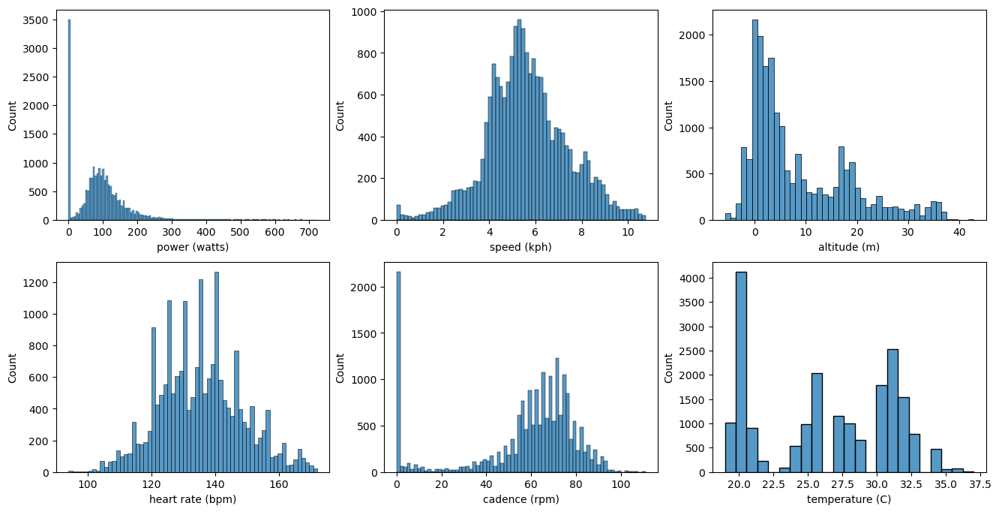

In [5]:
fig, axs = plt.subplots(2, 3, figsize=(16, 8))

sns.histplot(df0['power'], ax=axs[0, 0])
axs[0, 0].set_xlabel('power (watts)')

sns.histplot(df0['enhanced_speed'], ax=axs[0, 1])
axs[0, 1].set_xlabel('speed (kph)')

sns.histplot(df0['enhanced_altitude'], ax=axs[0, 2])
axs[0, 2].set_xlabel('altitude (m)')

sns.histplot(df0['heart_rate'], ax=axs[1, 0])
axs[1, 0].set_xlabel('heart rate (bpm)')

sns.histplot(df0['cadence'], ax=axs[1, 1])
axs[1, 1].set_xlabel('cadence (rpm)')

sns.histplot(df0['temperature'], ax=axs[1, 2])
axs[1, 2].set_xlabel('temperature (C)')

plt.show()

fig = px.line(df0, 'timestamp', 'power').update_layout(yaxis_title='power (watts)', title='target variable power as a timeseries')
fig.show()

The entire path of the ride is shown in the map below.

In [6]:
fig = px.scatter_mapbox(df0, lat='position_lat',lon='position_long', zoom=9.5, height=500, width=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Observations

While there are many outliers (upward skew) in `power`, the data doesn't exhibit abnormal behavior - for example it is known that competitive cyclists exhibit burst power up to 2000 watts during final sprints. Recreational cyclists' burst is in the 800-1200 watts range. The max of the power data above is well below this range, and as such, needs to be estimated rather than modified/dropped. Examination of map plots as above reveals that the sharp burts in power are due to climbing up and down steep slopes. 

There are also high counts at zero (ties) for `power` (and `cadence`). They are due to the bicycle stopping, so those are also valid. The impact of the ties will be somewhat mitigated with smoothing, which will be dealt with in Step 6 of this EDA.

From the time series plot of `power`, we also see that there are intervals when the sensors weren't functional. Data in these intervals will be dropped.  

Other features all seem to be within normal range as well, with the exception of `fractional_cadence` (which wasn't plotted as it contained zero information). 
The variable `distance` is the cumulative distance traveled in (meters), so wasn't plotted either.



### Actions
1. Drop `fractional_cadence` as it does not include any information
2. Since `power` is the target variable, we drop rows that don't have valid `power` (this step requires manual inspection of the data)
3. Impute missing (`position_lat`, `position_long`) values using linear interpolation
4. After performing the previous steps, see if there is need to impute `enhanced_speed` and `cadence`
   
Note that `heart_rate` is averaged (over 1-second intervals), while other variables are instantaneous. Thus to predict `power` (which is also instantaneous), we will need to low-pass filter it alongside the other instantaneous variables. Physics tells us that acceleration, and derivatives of a few other variables will be useful as feature engineering, so we shall compute them as well. After determining the window size for computing the moving average of the instantaneous variables, we shall

5. Compute the moving averages for the variables
6. Compute the derivative of these variables
7. Power will heavily depend on the slope of the terrain. Biking uses `grade` as the measure of steepness. We derive `grade` as the percentage ratio of the derivatives of `enhanced_altitude` and `distance`
8. Check if the derived variables make sense
9. Check for multicollinearity in the data
10. Establish a base line model
11. Examine feature importance

#### Steps 1-2 Drop fractional_cadence and observations with na power
The generator of the data informed me of sensor malfunction during two segments of the data. These segments will be dropped.

In [7]:
df = df0
df = df.drop(['fractional_cadence'], axis=1)

intv1 = np.logical_and(df['timestamp'] >= datetime(2023, 8, 26, 14, 5, 59), df['timestamp'] <= datetime(2023, 8, 26, 14, 10, 26))
intv2 = np.logical_and(df['timestamp'] >= datetime(2023, 8, 26, 14, 31, 38), df['timestamp'] <= datetime(2023, 8, 26, 15, 44, 1))
mask_bad_intervals = np.logical_or(intv1, intv2)
df = df[~mask_bad_intervals]

df = df.dropna(subset=['power'])

#### Step 3 Impute (position_lat, position_long) as necessary
It turns out that the previous step took care of the need to impute lat/long:

In [8]:
sum(df['position_lat'].isna()) + sum(df['position_long'].isna())

0

#### Step 4 Impute cadence and enhanced_speed as necessary
Check if the missing values of `cadence` corresponds to when `power` is 0. In this case it is reasonable to set `cadence` to 0.


In [9]:
print('# isna for enhanced_speed:', sum(df['enhanced_speed'].isna()), ';  # isna for enhanced_speed:', sum(df['cadence'].isna()))

sum(df.loc[df['cadence'].isna(), 'power'] != 0)
df.loc[df['cadence'].isna(), 'cadence'] = 0

print('after imputation # isna for cadence:', sum(df['cadence'].isna()))

# isna for enhanced_speed: 0 ;  # isna for enhanced_speed: 138
after imputation # isna for cadence: 0


Taking a tally of observations lost so far:

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19793 entries, 0 to 19986
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   timestamp          19793 non-null  datetime64[ns]
 1   position_lat       19793 non-null  float64       
 2   position_long      19793 non-null  float64       
 3   distance           19793 non-null  float64       
 4   enhanced_speed     19793 non-null  float64       
 5   enhanced_altitude  19793 non-null  float64       
 6   power              19793 non-null  float64       
 7   heart_rate         19793 non-null  int64         
 8   cadence            19793 non-null  float64       
 9   temperature        19793 non-null  int64         
dtypes: datetime64[ns](1), float64(7), int64(2)
memory usage: 1.7 MB


### Step 5 Compute moving averages for certain features

Moving average plays the role of a low-pass filter. This is necessary to rid of discretization errors. 
It was also taken so that the derivatives we compute in the subsequent steps do not get too choppy.
By examining offline the signal-to-noise ratio of the resulting variables I've determined to use the window size of 10 seconds. 
Determination of the window size is as much as an art as it is science. As such this step will be revisited in the future.

`np.convolve()` doesn't compute the moving averages weighted correctly, so I've rewritten a substitute function.


In [11]:
win_size = 10

df['power'] = movmean(df['power'], win_size)
df['enhanced_altitude'] = movmean(df['enhanced_altitude'], win_size)
df['enhanced_speed'] = movmean(df['enhanced_speed'], win_size)
df['cadence'] = movmean(df['cadence'], win_size)
df['distance'] = movmean(df['distance'], win_size)


It is critical that the variables are synchronized for any model to be successful. For instance increased power is related to the biker encountering a steep slope. Theory says that the average phase delay of the moving average is half of the window size. This was found to be true emperically, so I phase-shift the variables immediately above by 10/2=5.

In [12]:
def phase_shift(vec, shiftamnt):
    shifted_vec = np.empty_like(vec)
    shifted_vec[:] = np.nan
    shifted_vec[:len(vec)-shiftamnt] = vec[shiftamnt:]
    return shifted_vec

for col in ['power', 'enhanced_altitude', 'enhanced_speed', 'cadence', 'distance']:
    df[col] = phase_shift(df[col].values, int(win_size/2))


### Step 6 Compute derivatives

The [time] derivatives are simply diff's of the variables as the time intervals are mostly one second. For the column names of the derivatives, we prepend 'd_' to the original column names. For example `d_enhanced_speed` (*acceleration*) is the derivative of `enhanced_speed`. We filter out the rows when the time interval exceeds 1 second after we compute the derivatives. This is because derivatives do not make sense if the time interval is not 1.

In [13]:
for col in ['timestamp', 'enhanced_altitude', 'enhanced_speed', 'cadence', 'distance']:
    dcol = 'd_' + col
    df[dcol] = df[col].diff()


df = df[df['d_timestamp'] == timedelta(seconds=1)]

### Step 7 Compute new feature `grade`

In [14]:
def gradePrcnt(dy, dx):
    '''
    Computes grade (rise/run) percentage
    '''
    dx = np.array(dx, dtype=float)
    dy = np.array(dy, dtype=float)

    grade = np.divide(dy, dx, out=np.zeros_like(dx, dtype=float), where=dx!=0) * 100
    grade[np.logical_and(np.equal(dx, 0), np.equal(dy, 0))] = 0
    grade[np.logical_and(np.equal(dx, 0), dy > 0)] = np.inf
    grade[np.logical_and(np.equal(dx, 0), dy < 0)] = -np.inf
    return grade

df['grade'] = phase_shift(gradePrcnt(df['d_enhanced_altitude'].values, df['d_distance'].values), int(win_size/2))


### Step 8 Check if newly introduced features make sense; Examine correlation
Removing the na values introduced by moving averages/differentiation. Checking if the created variables make sense.

In [15]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19733 entries, 1 to 19976
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype          
---  ------               --------------  -----          
 0   timestamp            19733 non-null  datetime64[ns] 
 1   position_lat         19733 non-null  float64        
 2   position_long        19733 non-null  float64        
 3   distance             19733 non-null  float64        
 4   enhanced_speed       19733 non-null  float64        
 5   enhanced_altitude    19733 non-null  float64        
 6   power                19733 non-null  float64        
 7   heart_rate           19733 non-null  int64          
 8   cadence              19733 non-null  float64        
 9   temperature          19733 non-null  int64          
 10  d_timestamp          19733 non-null  timedelta64[ns]
 11  d_enhanced_altitude  19733 non-null  float64        
 12  d_enhanced_speed     19733 non-null  float64        
 13  d_cadence            

The above shows that we've retained more than 1-(19987-19733)/19987 = 98% of the original data. 

In [16]:
plot_grade = go.Scatter(x=df0['timestamp'], y=df['power'], mode='lines', name='power', yaxis='y')
plot_power = go.Scatter(x=df0['timestamp'], y=df['grade'], mode='lines', name='grade', yaxis='y2')
fig = go.Figure(data=[plot_grade, plot_power])

fig.update_layout(
    title='examination of the target variable vs. grade',
    yaxis_title='power (watts)',
    yaxis2=dict(
        title='grade (%)',
        overlaying='y',
        side='right'
    )
)

fig.show()

/home/sunuk/miniconda3/envs/exphys/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



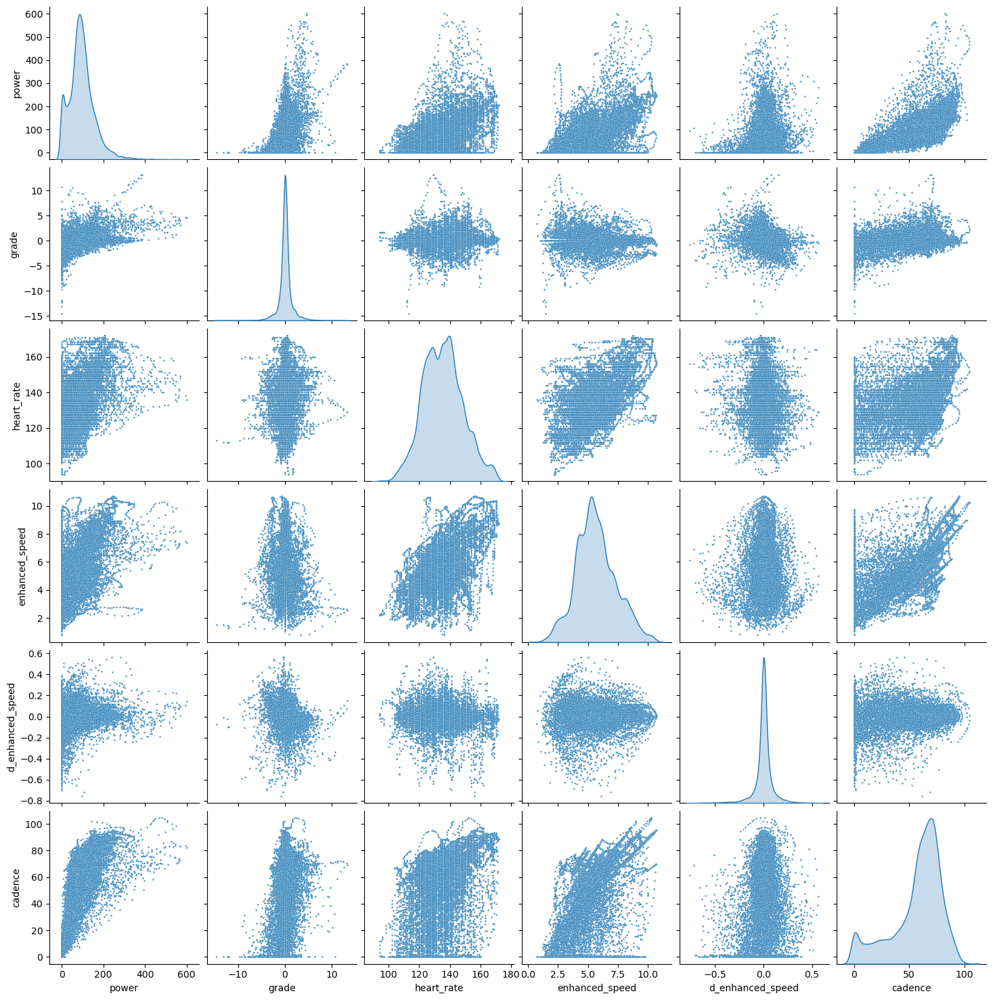

In [17]:
df_pairplot = df[['power', 'grade', 'heart_rate', 'enhanced_speed', 'd_enhanced_speed', 'cadence']]
sns.pairplot(df_pairplot, plot_kws={'s': 3}, diag_kind='kde')
plt.show()

The highest correlation is between `power` and `cadence`, which is to be expected:

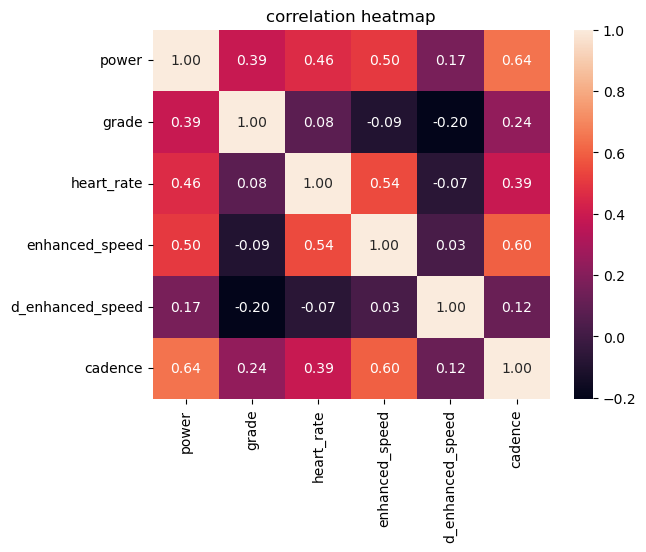

In [18]:
corr = np.corrcoef(df_pairplot, rowvar=False)

plt.figure()
sns.heatmap(corr, annot=True, fmt=".2f",
            xticklabels=['power', 'grade', 'heart_rate', 'enhanced_speed', 'd_enhanced_speed', 'cadence'],
            yticklabels=['power', 'grade', 'heart_rate', 'enhanced_speed', 'd_enhanced_speed', 'cadence'])
plt.title("correlation heatmap")
plt.show()

### Step 9 Remove collinearity 
To remove collinearity among the features it is possible to utilize PCA. However our features all pertain to named quantities in physics, so we prefer not to use PCA.

Instead we use VIF (Variance Inflation Factor) to determine collinearity.

First we remove the features that won't be used, and sequentially remove features that have high VIF.

In [19]:
X = df.drop(['power', 'timestamp', 'd_timestamp', 'position_lat', 'position_long'], axis=1)
X = pd.concat([pd.Series(1, index=X.index, name='const'), X], axis=1)


vif = pd.DataFrame()
vif["Feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif

,Feature,VIF
0,const,162.456667
1,distance,2.132815
2,enhanced_speed,55.058548
3,enhanced_altitude,1.328931
4,heart_rate,2.074169
5,cadence,2.241179
6,temperature,2.265631
7,d_enhanced_altitude,2.012101
8,d_enhanced_speed,1.367312
9,d_cadence,1.277211


The high VIF for `enhanced_speed` and `d_distance` were to be expected ($d = v\cdot t$).
`enhanced_speed` is critical for explainability. Hence we drop `d_distance` and recompute.

In [20]:
X = df.drop(['power', 'timestamp', 'd_timestamp', 'position_lat', 'position_long', 'd_distance'], axis=1)
X = pd.concat([pd.Series(1, index=X.index, name='const'), X], axis=1)


vif = pd.DataFrame()
vif["Feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif

,Feature,VIF
0,const,162.209343
1,distance,2.130183
2,enhanced_speed,2.484608
3,enhanced_altitude,1.325060
4,heart_rate,2.074050
5,cadence,2.241047
6,temperature,2.262228
7,d_enhanced_altitude,2.011645
8,d_enhanced_speed,1.364601
9,d_cadence,1.276937


VIF numbers above are sufficient, so we'll keep the features listed above.

### Step 10 Establish baseline model.
We will use linear regression against the selected features in Step 9 as the baseline model to compare with other models later.

In [21]:

seed = 32
keep = ['grade', 'heart_rate', 'enhanced_speed', 'd_enhanced_speed', 'cadence', 'd_cadence', 'enhanced_altitude', 'd_enhanced_altitude', 'distance', 'temperature']
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('linreg', LinearRegression())
])

X = df[keep]
y = df['power']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)

pipe.fit(X_train, y_train)

y_pred_train = pipe.predict(X_train)
y_pred = pipe.predict(X_test)

mse = [mean_squared_error(y_pred_train, y_train), mean_squared_error(y_pred, y_test)]
mae = [mean_absolute_error(y_pred_train, y_train), mean_absolute_error(y_pred, y_test)]

results = pd.DataFrame({'dataset': ['train', 'test'], 'MAE':mae, 'MSE': mse})
results = results.set_index('dataset')
results

,MAE,MSE
dataset,,
train,26.789471,1519.128187
test,26.270477,1409.870015


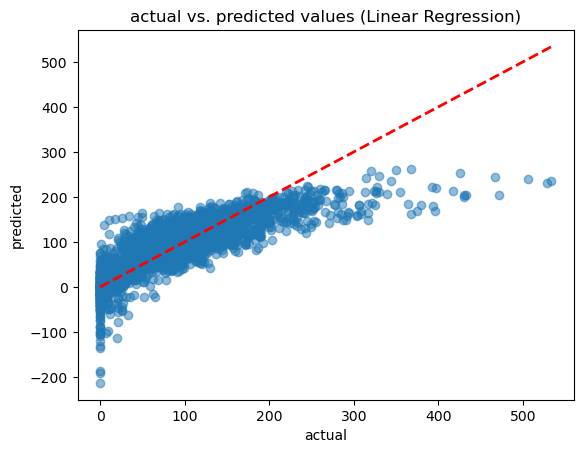

In [22]:
plt.figure()
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('actual')
plt.ylabel('predicted')
plt.title("actual vs. predicted values (Linear Regression)")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2)
plt.show()

The plot below compares the prediction for the entirety of the dataset. Its purpose is to aid in examining the conditions under which the predictions go wrong. For example the plot shows that the linear regressor underestimates/overestimates power when power has sharp upward/downward peaks. This most likely is due to the effect of gravity. 

Other possible forces at work are:
- wind drag
- rolling resistance
- braking power
- friction force due to drive train (chains, gears, etc)

The effect of gravity will be modeled in the main project submission. The effect of other forces will also be discussed and possibly modeled at that time.

In [23]:
y_pred_all = pipe.predict(X)

plot_actual = go.Scatter(x=df['timestamp'], y=y, mode='lines', name='actual')
plot_predicted = go.Scatter(x=df['timestamp'], y=y_pred_all, mode='lines', name='predicted')
fig = go.Figure(data=[plot_actual, plot_predicted])

fig.update_layout(yaxis_title='power (watts)', title='actual vs. predicted')
fig.show()

[optional] Save the cleaned dataset for future use.

In [24]:
X_df = df.drop('d_timestamp', axis=1).set_index(df['timestamp'])
y_pred_all = pd.DataFrame(y_pred_all, columns=['y_pred_linreg']).set_index(df['timestamp'])
# pd.concat([X_df, y_pred_all], axis=1).to_csv(processed_file, index=False)

### Step 11 Feature importance

We use LassoCV to examine feature importance. The results below show that none of the features get dropped by Lasso.

selected alpha: 0.000774263682681127


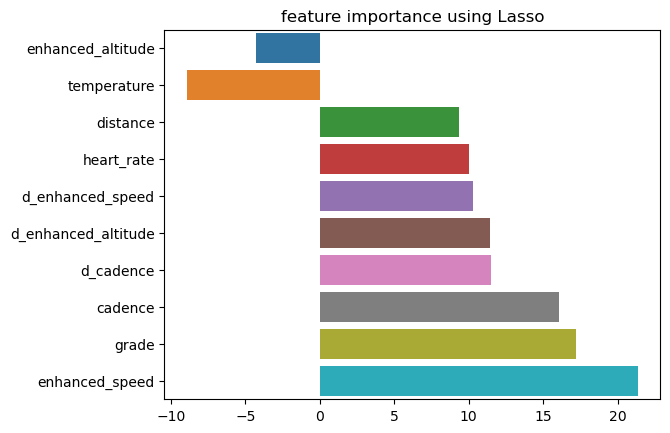

In [25]:
pipe_lasso = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', LassoCV(alphas=np.logspace(-4, 4, 100), cv=5))
])

pipe_lasso.fit(X_train, y_train)
selected_alpha = pipe_lasso.named_steps['lasso'].alpha_
coefs = pipe_lasso.named_steps['lasso'].coef_

print('selected alpha:', selected_alpha)
idx = np.argsort(abs(coefs))
cols = X_train.columns[idx]

sns.barplot(y=cols, x=coefs[idx])
plt.title('feature importance using Lasso')
plt.show()